# Datos tabulares

## Librerías

In [85]:
%matplotlib inline

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
from plotly.subplots import make_subplots
import seaborn as sns
from typing import List
from ydata_profiling import ProfileReport
import umap
import warnings
warnings.filterwarnings('ignore')

pd.set_option('display.max_columns', 1000)

np.random.seed(42)
pio.renderers.default = "plotly_mimetype+notebook"

DATA_PATH = "../data/tabular-data/"
REPORTING_PATH = "../data/reporting/"
PROJECTIONS_PATH = "../data/projections/"

## Dataset

El conjunto de datos **KDD99 Cup** es ampliamente utilizado para la detección de intrusiones en redes. Contiene datos simulados de **tráfico de red**, categorizados como normales o indicativos de diferentes tipos de ataques. El conjunto incluye **41 características**, que se agrupan en características básicas de la red (por ejemplo, duración, tipo de protocolo), características de contenido (por ejemplo, número de intentos de inicio de sesión fallidos) y características basadas en el tráfico (por ejemplo, conexiones al mismo host). La variable objetivo indica si la conexión es normal o pertenece a uno de cuatro tipos de ataque: DOS, R2L, U2R y sondeo.

Para este taller y con fines demostrativos, se ha utilizado una **versión reducida del KDD99 Cup**  (muestra estratificada) de este conjunto de datos, con menos clases para facilitar la comprensión, las visualizaciones y la velocidad de ejecución.








In [2]:
kdd99 = pd.read_csv(f"{DATA_PATH}kdd-cup-1999-data-pycon.csv", delimiter=',')

In [3]:
kdd99.shape

(154277, 42)

In [4]:
kdd99.head()

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,num_failed_logins,logged_in,num_compromised,root_shell,su_attempted,num_root,num_file_creations,num_shells,num_access_files,num_outbound_cmds,is_host_login,is_guest_login,count,srv_count,serror_rate,srv_serror_rate,rerror_rate,srv_rerror_rate,same_srv_rate,diff_srv_rate,srv_diff_host_rate,dst_host_count,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,label
0,0,icmp,ecr_i,SF,1032,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,511,511,0.0,0.0,0.0,0.0,1.00,0.00,0.0,255,255,1.00,0.00,1.0,0.0,0.0,0.0,0.0,0.0,smurf.
1,0,icmp,ecr_i,SF,1032,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,510,510,0.0,0.0,0.0,0.0,1.00,0.00,0.0,255,255,1.00,0.00,1.0,0.0,0.0,0.0,0.0,0.0,smurf.
2,0,tcp,private,S0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,136,16,1.0,1.0,0.0,0.0,0.12,0.05,0.0,255,4,0.02,0.08,0.0,0.0,1.0,1.0,0.0,0.0,neptune.
3,0,tcp,private,REJ,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,137,4,0.0,0.0,1.0,1.0,0.03,0.06,0.0,255,4,0.02,0.05,0.0,0.0,0.0,0.0,1.0,1.0,neptune.
4,0,icmp,ecr_i,SF,1032,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,511,511,0.0,0.0,0.0,0.0,1.00,0.00,0.0,255,255,1.00,0.00,1.0,0.0,0.0,0.0,0.0,0.0,smurf.


### Descripción de los tipos de tráfico (indicados por la variable 'label'):

| **Tipo de Ataque**     | **Descripción**                                                                                                                                                     |
|:-----------------------|:--------------------------------------------------------------------------------------------------------------------------------------------------------------------|
| **Smurf**              | Un ataque DDoS que utiliza solicitudes de eco ICMP enviadas a una dirección de difusión, abrumando a la víctima con respuestas.                                   |
| **Neptune**            | Un ataque de inundación SYN que agota los recursos del servidor enviando numerosas solicitudes SYN para establecer conexiones TCP.                                  |
| **Normal**             | Tráfico regular sin ningún comportamiento malicioso, que sirve como base para comparaciones.                                                                      |
| **Back**               | Un ataque que utiliza un caballo de Troya para abrir una puerta trasera, permitiendo el acceso no autorizado a los sistemas.                                       |
| **Satan**              | Un ataque de escaneo de red para encontrar vulnerabilidades utilizando la herramienta Satan.                                                                         |
| **Ipsweep**            | Un ataque de reconocimiento que escanea un rango de direcciones IP para identificar hosts activos.                                                                  |
| **Portsweep**          | Similar a Ipsweep, implica escanear múltiples puertos en hosts para encontrar servicios abiertos.                                                                    |
| **Warezclient**        | Un ataque relacionado con la compartición ilegal de archivos y la descarga de software pirateado.                                                                   |
| **Teardrop**           | Un ataque que envía paquetes fragmentados a un objetivo, causando que se bloquee o se vuelva inestable.                                                            |
| **Pod**                | Un ataque de Ping of Death que envía paquetes sobredimensionados, lo que lleva a bloqueos del sistema o inestabilidad.                                            |
| **Nmap**               | Una herramienta de escaneo de red utilizada para descubrir hosts y servicios, que también puede ser explotada con fines maliciosos.                                |
| **Guess_passwd**       | Un ataque que intenta adivinar contraseñas de usuario a través de varios métodos, como ataques de fuerza bruta o diccionario.                                    |
| **Buffer_overflow**    | Un ataque que explota el búfer de un programa escribiendo más datos de los que puede contener, lo que permite la ejecución de código arbitrario.                  |
| **Land**               | Un ataque que envía paquetes con la misma dirección IP de origen y destino, causando confusión y potencial denegación de servicio.                                 |
| **Warezmaster**        | Similar a Warezclient, enfocado en distribuir software pirateado, a menudo involucrando redes de pares.                                                            |


## Profile report

El **perfilado de datos** es el proceso de examinar, analizar y resumir de manera exhaustiva un conjunto de datos. Esto implica generar de estadísticas descriptivas y métricas clave sobre las características de los datos, como el tipo de datos, las distribuciones, los valores faltantes, las relaciones entre variables, y cualquier anomalía sencilla o patrón notable.

### ¿Por qué es importante el perfilado de datos?
1. **Comprensión inicial de los datos**: Es el primer paso esencial en la exploración de datos, permitiendo a los analistas o científicos de datos obtener una visión clara de la estructura y calidad del conjunto de datos.
   
2. **Detección de problemas de calidad**: Ayuda a identificar problemas como valores ausentes, duplicados, outliers y errores en el formato de los datos. Esto es crucial para tomar decisiones informadas sobre la limpieza y transformación necesarias antes de proceder con el modelado o análisis.

3. **Estandarización del proceso de exploración**: Al realizar un perfilado, se crea un proceso sistemático y repetible para explorar cualquier conjunto de datos. Esto facilita la **transparencia** y **reproducibilidad**, ya que otros miembros del equipo pueden revisar y comprender rápidamente el análisis exploratorio realizado.

4. **Comunicación clara**: Al generar un informe detallado y automatizado sobre los datos, se facilita la **comunicación entre equipos**, ya que tanto analistas como stakeholders pueden revisar el perfil de los datos sin necesidad de un conocimiento técnico profundo.

   

### ydata-profiling
**Ydata-profiling** (anteriormente conocido como pandas-profiling) es una herramienta que **automatiza el perfilado de datos** y proporciona un informe completo con información relevante sobre el conjunto de datos. Ofrece varias características importantes:

1. **Resumen automático de las variables**: Genera un análisis detallado de cada variable del dataset (numéricas, categóricas, fechas, etc.), incluyendo su distribución, valores únicos, porcentajes de valores faltantes y su impacto en el análisis posterior.
   
2. **Detección de correlaciones**: Identifica correlaciones entre variables para ayudar a detectar redundancias o relaciones fuertes que podrían ser relevantes para modelos predictivos o análisis avanzados.
   
3. **Análisis de interacciones**: Permite explorar cómo interactúan dos o más variables entre sí, lo que es útil para análisis multivariados.
   
4. **Detección de anomalías**: Identifica automáticamente posibles outliers, duplicados y otros problemas de calidad en los datos.
   
5. **Generación de reportes interactivos en HTML**: Ydata-profiling genera **reportes en formato HTML**, lo que permite visualizar el análisis de forma interactiva. Estos informes son fáciles de compartir y revisar por cualquier miembro del equipo, incluso aquellos sin conocimientos técnicos avanzados.

6. **Versionable**: Como los reportes generados son archivos, pueden ser **versionados** usando sistemas de control de versiones como Git, permitiendo un seguimiento y comparación de cómo han evolucionado los datos y el análisis exploratorio en distintas etapas de un proyecto.

### Importancia en la estandarización y el proceso colaborativo
Ydata-profiling facilita la creación de un proceso de exploración de datos estandarizado. Al ser una herramienta automatizada, ahorra tiempo en la creación de resúmenes de datos y asegura que todos los aspectos relevantes de los datos sean analizados de forma consistente. Esto fomenta la **colaboración** y asegura que todos los equipos trabajen con el mismo conocimiento detallado de los datos, mejorando la eficiencia en proyectos conjuntos.

In [80]:
# Código para generar un profile report completo.
profile = ProfileReport(kdd99, title="Base Profiling Report")
profile.to_file(f"{REPORTING_PATH}profile_report.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [81]:
def generate_efficient_profile(df: pd.DataFrame, sampling_fraction: float = 1.0) -> ProfileReport:
    """
    Genera un ProfileReport eficiente para dataframes grandes utilizando ydata-profiling.
    
    Args:
        df (pd.DataFrame): El dataframe a perfilar.
        sampling_fraction (float): La fracción de filas a muestrear (por defecto es 1.0 para no muestrear).

    Returns:
        ProfileReport: El ProfileReport generado.
    """
    # Calcula el tamaño de la muestra en función de la fracción de muestreo
    sample_size = int(len(df) * sampling_fraction)

    # Muestra el dataframe si la fracción de muestreo es menor que 1.0
    if sampling_fraction < 1.0 and len(df) > sample_size:
        df_sampled = df.sample(n=sample_size, random_state=42)
    else:
        df_sampled = df

    # Genera el informe de perfil con configuraciones eficientes
    profile = ProfileReport(
        df_sampled,
        title="Informe de Perfil de Datos Eficiente",
        minimal=True,  # Usa el modo mínimo para omitir cálculos pesados como interacciones
    )
    return profile

In [82]:
# Generamos una versión reducida del ProfileReport
profile = generate_efficient_profile(kdd99)
profile.to_file(f"{REPORTING_PATH}reduced_profile_report.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

## Limpieza de los datos acorde al análisis preliminar realizado

Para preparar el conjunto de datos KDD99 para el modelado y análisis, se ha implementado una **pipeline de preprocesado** que integra tres funciones clave, diseñadas para limpiar y transformar el dataset de manera eficiente. Esta pipeline aplica las siguientes transformaciones:

1. **Eliminación de columnas constantes**: La función `remove_constant_columns` identifica y elimina aquellas columnas que no aportan variabilidad al conjunto de datos, es decir, aquellas cuyo valor es constante en todas las filas.
   
2. **Codificación de variables categóricas**: Utilizando la función `encode_kdd99`, se realiza una codificación *one-hot* de las variables categóricas seleccionadas. Este paso transforma dichas variables en representaciones numéricas, lo que facilita su utilización en modelos de machine learning.

3. **Eliminación de características altamente correlacionadas**: Finalmente, con la función `drop_highly_correlated_features`, se eliminan las columnas que presentan una alta correlación entre sí, lo que reduce la multicolinealidad y simplifica el modelo.

Este flujo de preprocesamiento optimiza el conjunto de datos, eliminando redundancias y mejorando la calidad de los datos de entrada para un análisis más eficiente y preciso.

In [36]:
def remove_constant_columns(df: pd.DataFrame) -> pd.DataFrame:
    """
    Elimina columnas del DataFrame que tengan valores constantes.
    
    Args:
        df (pd.DataFrame): El DataFrame a procesar.
        
    Returns:
        pd.DataFrame: El DataFrame con las columnas constantes eliminadas.
    """
    # Usa nunique para encontrar el número de valores únicos por columna y conserva solo las que tienen más de 1 valor único
    constant_mask = df.nunique() > 1
    
    # Filtra el DataFrame para conservar solo las columnas no constantes
    df_cleaned = df.loc[:, constant_mask]

    return df_cleaned

    
def encode_kdd99(df: pd.DataFrame, columns_to_encode: List) -> pd.DataFrame:
    """
    Codifica las variables categóricas en el conjunto de datos KDD99 usando one-hot encoding.
    
    Args:
        df (pd.DataFrame): El DataFrame original de KDD99 con variables categóricas.
    
    Returns:
        pd.DataFrame: El DataFrame con las variables categóricas codificadas mediante one-hot encoding.
    """
    # Realiza el one-hot encoding
    df_encoded = pd.get_dummies(df, columns=columns_to_encode, drop_first=True)
    
    return df_encoded


def drop_highly_correlated_features(df: pd.DataFrame, threshold: float = 0.98) -> pd.DataFrame:
    """
    Elimina columnas del DataFrame que tienen una correlación mayor al umbral especificado.
    
    Args:
        df (pd.DataFrame): El DataFrame de entrada con características numéricas.
        threshold (float): El umbral de correlación para eliminar columnas (por defecto es 0.98).
    
    Returns:
        pd.DataFrame: Un nuevo DataFrame con las columnas altamente correlacionadas eliminadas.
    """
    # Selecciona solo las columnas numéricas
    numeric_df = df.select_dtypes(include=[np.number])

    # Calcula la matriz de correlación
    corr_matrix = numeric_df.corr().abs()

    # Obtén el triángulo superior de la matriz de correlación
    upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

    # Encuentra las columnas con correlación superior al umbral
    to_drop = [column for column in upper.columns if any(upper[column] > threshold)]

    # Elimina esas columnas del DataFrame original
    df_reduced = df.drop(columns=to_drop)
    
    return df_reduced


def encode_boolean_columns(df: pd.DataFrame) -> pd.DataFrame:
    """
    Convierte las variables booleanas en enteros (0 y 1).
    
    Args:
        df (pd.DataFrame): El DataFrame original con posibles columnas booleanas.
    
    Returns:
        pd.DataFrame: El DataFrame con las columnas booleanas codificadas como 0 y 1.
    """
    # Selecciona las columnas booleanas
    bool_cols = df.select_dtypes(include=[bool]).columns
    
    # Convierte los valores booleanos en enteros
    df[bool_cols] = df[bool_cols].astype(int)
    
    return df

Esta celda encadena en una `pipe()` las transformaciones de manera ordenada:

In [37]:
kdd99_processed = (
    kdd99
    .pipe(remove_constant_columns)                      # Step 1: Remove constant columns
    .pipe(lambda df: encode_kdd99(df, columns_to_encode=['protocol_type', 'service', 'flag']))  # Step 2: One-hot encode categorical variables
    .pipe(encode_boolean_columns)                       # Step 3: Encode boolean variables as 0 or 1
    .pipe(lambda df: drop_highly_correlated_features(df, threshold=0.99))  # Step 4: Drop highly correlated features with custom threshold
)

El resultado es un conjunto de datos "limpio" y optimizado, listo para el modelado y análisis.

In [28]:
kdd99_processed.shape

(154277, 108)

## Nuevo perfilado de los datos tras la limpieza

Tras aplicar el proceso de preprocesado al conjunto de datos KDD99, se lleva a cabo un nuevo perfilado utilizando **ydata-profiling** con el objetivo de verificar los resultados y asegurarse de que las principales alertas detectadas en el análisis inicial han sido resueltas. 

En el perfilado previo, se habían identificado diversas alertas relacionadas con:

- **Columnas constantes**: Variables sin variabilidad que no aportan información útil al modelo.
- **Variables categóricas no codificadas**: Problemas derivados de la falta de transformación de estas variables.
- **Alta correlación entre características**: La multicolinealidad podía afectar la precisión del modelo.

In [83]:
profile = generate_efficient_profile(kdd99_processed)
profile.to_file(f"{REPORTING_PATH}reduced_profile_report_clean.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Con el nuevo perfilado, verificamos que estas alertas han desaparecido o disminuido significativamente tras aplicar los pasos de preprocesado (eliminación de columnas constantes, codificación de variables categóricas y eliminación de características correlacionadas). Esto asegura que el conjunto de datos está ahora en mejores condiciones para un análisis y modelado más robusto, libre de redundancias.

## UMAP

La reducción de dimensionalidad es una técnica clave en **aprendizaje no supervisado**, que nos ayuda visualizar y entender conjuntos de datos de **alta dimensión**. Una de las técnicas más populares para la visualización es **t-SNE**, pero  como hemos mencionado en el taller, puede ser lenta y complicada de usar con grandes volúmenes de datos. Aquí es donde entra en juego UMAP.

**¿Qué es UMAP?**

UMAP (Uniform Manifold Approximation and Projection) es un método reciente (2018) que ofrece varias ventajas sobre t-SNE. Su principal atractivo radica en su **rapidez** y en su **capacidad para preservar la estructura global de los datos**, además de las relaciones locales entre ellos. Esto significa que UMAP no solo agrupa bien los datos similares, sino que también mantiene la disposición general de las diferentes categorías o clusters.

**Intuición detrás de UMAP**

UMAP funciona construyendo una representación gráfica de los datos en alta dimensión y luego optimiza esta representación para que se parezca a una versión en baja dimensión. Para hacer esto, UMAP crea lo que se llama un "*complejo simplicial difuso*", que es un gráfico en el que las conexiones entre los puntos son ponderadas. Este enfoque permite que UMAP identifique qué puntos están más cercanos entre sí y, por lo tanto, deberían estar agrupados en la proyección final.

La construcción del gráfico comienza extendiendo un radio desde cada punto en el espacio de alta dimensión. Si otros puntos caen dentro de este radio, se establecen conexiones. Sin embargo, UMAP aplica un enfoque "**difuso**", lo que significa que la probabilidad de conexión disminuye a medida que se alejan, lo que ayuda a equilibrar las relaciones locales y globales en los datos.

**Parámetros Clave**

Dos parámetros importantes en UMAP son `n_neighbors`, que controla cuántos vecinos cercanos se consideran al construir el gráfico, y `min_dist`, que define la distancia mínima entre puntos en la proyección final. Ajustar estos parámetros permite a los usuarios manipular cómo se enfatizan las estructuras locales frente a las globales. Un valor bajo de `n_neighbors` se centrará más en la estructura local, mientras que uno más alto considerará más la disposición global de los datos.

**TL;DR**

UMAP es una herramienta poderosa para la visualización de datos de alta dimensión, que ofrece ventajas computacionales sobre métodos como t-SNE. Al entender su funcionamiento intuitivo y cómo ajustar sus parámetros, los científicos de datos pueden aprovechar mejor esta técnica para extraer información valiosa de conjuntos de datos complejos. Sin embargo, como con cualquier técnica de reducción de dimensionalidad, es crucial tener cuidado al interpretar los resultados, ya que se distorsiona la información al reducirla a dimensiones más bajas.

### Preparación de los datos para UMAP

A continución se preparan los datos para el modelado con UMAP:

1. **Separación de características y etiqueta**: Separamos las columnas con características (X) de la etiqueta a predecir (y).
2. **Selección de columnas numéricas**: Elegimos solo las columnas numéricas para el análisis con UMAP.
3. **Estandarización (opcional)**: Se puede escalar los datos para mejorar el rendimiento de UMAP.
4. **Submuestreo**: Limitamos el conjunto, manteniendo la proporción de clases, para facilitar el procesamiento.

In [38]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

# Separar características y etiqueta
X = kdd99_processed.drop(columns=['label'])
y = kdd99_processed['label']

# Seleccionar solo las columnas numéricas para UMAP
X_numeric = X.select_dtypes(include=['float64', 'int64'])

# Opcional: Estandarizar los datos (UMAP funciona mejor con datos escalados)
# scaler = StandardScaler()
# X_scaled = scaler.fit_transform(X_numeric)

# Submuestrear los datos a un tamaño manejable (por ejemplo, 50,000 muestras), estratificado por la distribución de etiquetas
X_sample, X_unseen, y_sample, y_unseen = train_test_split(X_numeric, y, train_size=30000, test_size=5000, stratify=y, random_state=42)

### UMAP en 2D

Aplicamos UMAP con el método `fit_transform()` para que aplique la transformación sobre el conjunto:

In [40]:
%%time
# Proyección UMAP en 2 dimensiones
umap_2d = umap.UMAP(n_neighbors=50, n_components=2) ## Valor por defecto de n_neighbors = 15, lo subimos para priorizar estructura global
X_2d = umap_2d.fit_transform(X_sample)

CPU times: user 20min 3s, sys: 4.79 s, total: 20min 8s
Wall time: 1min 39s


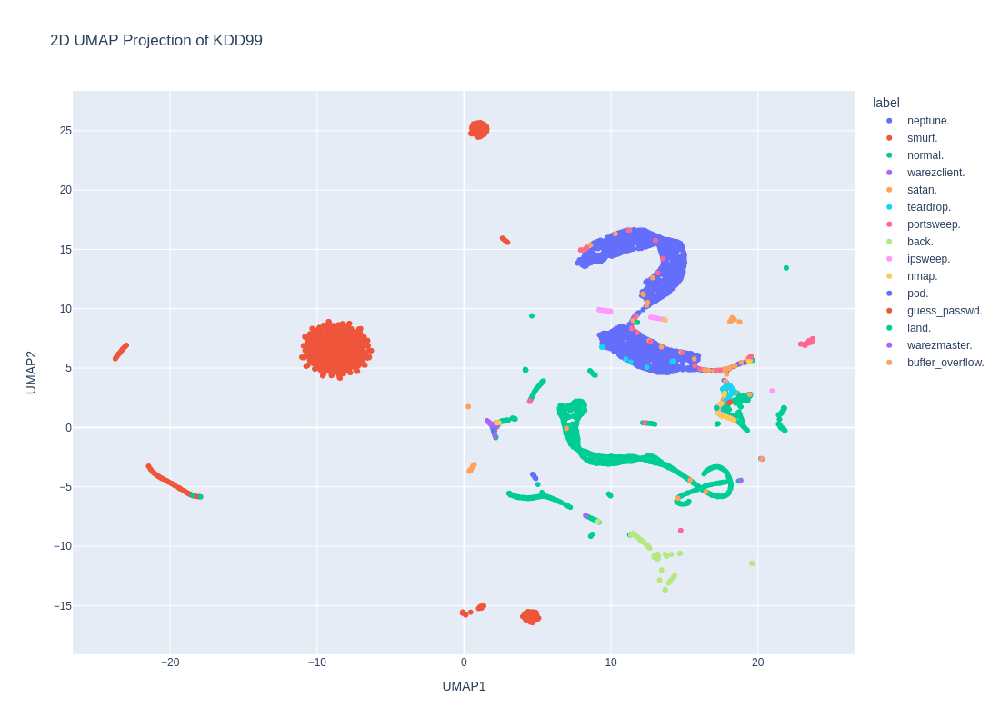

In [41]:
# Create DataFrames for 2D and 3D projections
df_2d = pd.DataFrame(X_2d, columns=['UMAP1', 'UMAP2'])
df_2d['label'] = y_sample.values

# Plot 2D projection with Plotly
fig_2d = px.scatter(df_2d, x='UMAP1', y='UMAP2', color='label', title="2D UMAP Projection of KDD99", height=800)  # Set the height in pixels (adjust as needed))
fig_2d.show()

#### **OPCIONAL**: con la siguiente celda podéis probar a ver la proyección de los datos en un espacio 3D, guardará ciertas similitudes con la 2D


In [ ]:
%%time 

# Proyección UMAP en 3D
umap_3d = umap.UMAP(n_components=3, n_neighbors=50)
X_3d = umap_3d.fit_transform(X_sample)

df_3d = pd.DataFrame(X_3d, columns=['UMAP1', 'UMAP2', 'UMAP3'])
df_3d['label'] = y_sample.values

# Plot 3D projection with Plotly
fig_3d = px.scatter_3d(df_3d, x='UMAP1', y='UMAP2', z='UMAP3', color='label', title="3D UMAP Projection of KDD99")
fig_3d.show()

## Clustering con HDBSCAN

El **clustering** es una técnica esencial en el análisis de datos y el aprendizaje no supervisado. Su principal objetivo es agrupar un conjunto de objetos (datos) en clústeres, de manera que los elementos dentro de un mismo clúster sean más similares entre sí que a los de otros clústeres. Esto permite descubrir patrones y estructuras en datos no etiquetados, facilitando la identificación de segmentos o grupos relevantes.

El clustering se utiliza en diversas aplicaciones, como segmentación de clientes, detección de anomalías, compresión de imágenes y análisis de redes. La capacidad de agrupar datos de forma efectiva es crucial para la exploración y el análisis de grandes volúmenes de información.

### HDBSCAN: Un Algoritmo de Clustering Robusto

HDBSCAN es un algoritmo de clustering que extiende el algoritmo DBSCAN convirtiéndolo en un algoritmo de clustering jerárquico, utilizando una técnica para extraer un clustering plano basado en la estabilidad de los clústeres. 

### ¿Cómo Funciona HDBSCAN?

El algoritmo HDBSCAN se puede dividir en varios pasos:

1. **Transformar el Espacio**: HDBSCAN comienza por estimar la densidad de los puntos en el espacio de datos, diferenciando entre áreas densas (islas) y áreas menos densas (mar). Para hacer esto, se utiliza una métrica de distancia llamada **mutual reachability distance** (distancia de alcanzabilidad mutua), que ajusta las distancias de los puntos según su densidad.

2. **Construir el Árbol de Espanning Mínimo**: Con la nueva métrica de distancia, HDBSCAN construye un árbol de espanning mínimo, que representa las conexiones más fuertes entre los puntos, facilitando la identificación de clústeres densos.

3. **Construir la Jerarquía de Clústeres**: A partir del árbol de espanning, se genera una jerarquía de clústeres mediante un proceso de unión, donde los componentes conectados se combinan en clústeres a diferentes umbrales de distancia.

4. **Condensar el Árbol de Clústeres**: HDBSCAN condensa la jerarquía de clústeres al eliminar clústeres que no alcanzan un tamaño mínimo, lo que ayuda a filtrar el ruido y enfocarse en clústeres persistentes.

5. **Extraer Clústeres Estables**: Finalmente, el algoritmo identifica los clústeres más estables y robustos a partir de la jerarquía condensada, considerando la persistencia de los clústeres a lo largo de diferentes niveles de densidad.

Importamos el módulo de HDBSCAN de sklearn y lo fiteamos con un tamaño mínimo de cluster generoso, para que se formen clusters fácilmente visibles y un número reducido de ellos:

In [46]:
from sklearn.cluster import HDBSCAN

# Realizar el clustering HDBSCAN en la proyección UMAP 2D
clusterer = HDBSCAN(min_cluster_size=300, min_samples=150)
df_2d['cluster'] = clusterer.fit_predict(df_2d[['UMAP1', 'UMAP2']])

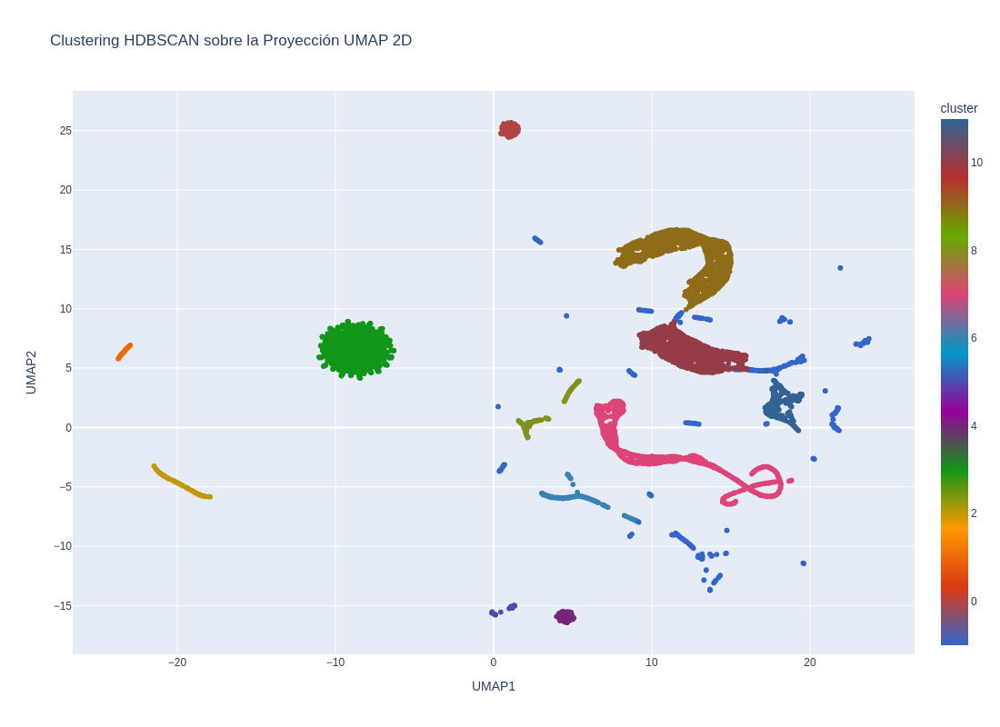

In [47]:
# Visualizar los clústeres usando Plotly
fig_clusters = px.scatter(
    df_2d, 
    x='UMAP1', 
    y='UMAP2', 
    color='cluster',  # Colorear según las asignaciones de clúster de HDBSCAN
    title="Clustering HDBSCAN sobre la Proyección UMAP 2D",
    color_continuous_scale=px.colors.qualitative.G10,
    height=800  # Set the height in pixels (adjust as needed)

)
fig_clusters.show()

### Comparación de las etiquetas frente a los clusters en los datos proyectados:

Creamos una figura con dos gráficos de dispersión para analizar las proyecciones UMAP. En el primer gráfico, los puntos están coloreados según sus etiquetas, y en el segundo, según los clusters.

Esto permite visualizar cómo se distribuyen los datos tanto por etiqueta como por cluster e investigar las relaciones entre las proyecciones UMAP y las agrupaciones, tanto en términos de etiquetas como de clusters.

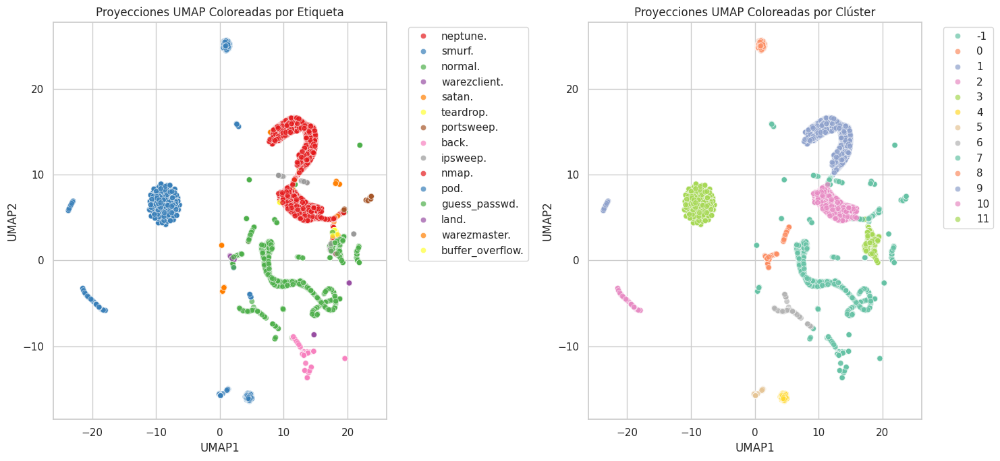

In [79]:
# Establecer el estilo
sns.set(style="whitegrid")

# Crear una figura con dos subgráficas
fig, axes = plt.subplots(1, 2, figsize=(15, 7))

# Representar las etiquetas
sns.scatterplot(ax=axes[0], x='UMAP1', y='UMAP2', hue='label', data=df_2d, palette='Set1', alpha=0.7)
axes[0].set_title('Proyecciones UMAP Coloreadas por Etiqueta')
axes[0].set_xlabel('UMAP1')
axes[0].set_ylabel('UMAP2')
axes[0].legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Representar los clusters
sns.scatterplot(ax=axes[1], x='UMAP1', y='UMAP2', hue='cluster', data=df_2d, palette='Set2', alpha=0.7)
axes[1].set_title('Proyecciones UMAP Coloreadas por Clúster')
axes[1].set_xlabel('UMAP1')
axes[1].set_ylabel('UMAP2')
axes[1].legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Ajustar el diseño para evitar superposiciones
plt.tight_layout()

# Guardar la figura en un archivo
plt.show()  # Cerrar la figura para liberar memoria

## Análisis 1: Proyectamos nuevos datos normales al conjunto para ver cómo se relacionan con los proyectados existentes

Una vez construido un modelo UMAP, se puede emplear para proyectar nuevos puntos que no haya visto haciendo uso del método `fit()`.

Las siguientes celdas transforman no vistos a un espacio bidimensional utilizando UMAP y crea un DataFrame con esos puntos. Luego, se añade etiquetas correspondientes a los datos no vistos, y se filtran los puntos etiquetados como "normal", cambia su etiqueta a "new_normal" y finalmente concatena este nuevo conjunto de datos con un DataFrame existente. Esto permite integrar y diferenciar los nuevos puntos en un análisis posterior.

In [60]:
# Proyectamos datos no vistos por el modelo
new_points_2d = umap_2d.transform(X_unseen)

Creamos los dataframes necesarios para la visualización:

In [61]:
df_2d_unseen = pd.DataFrame(new_points_2d, columns=['UMAP1', 'UMAP2'])
df_2d_unseen["label"]= y_unseen.values

new_normal_points_df = df_2d_unseen[df_2d_unseen["label"]== "normal."]
new_normal_points_df.loc[:, "label"] = "new_normal"

df_with_new_points = pd.concat([df_2d, new_normal_points_df ])

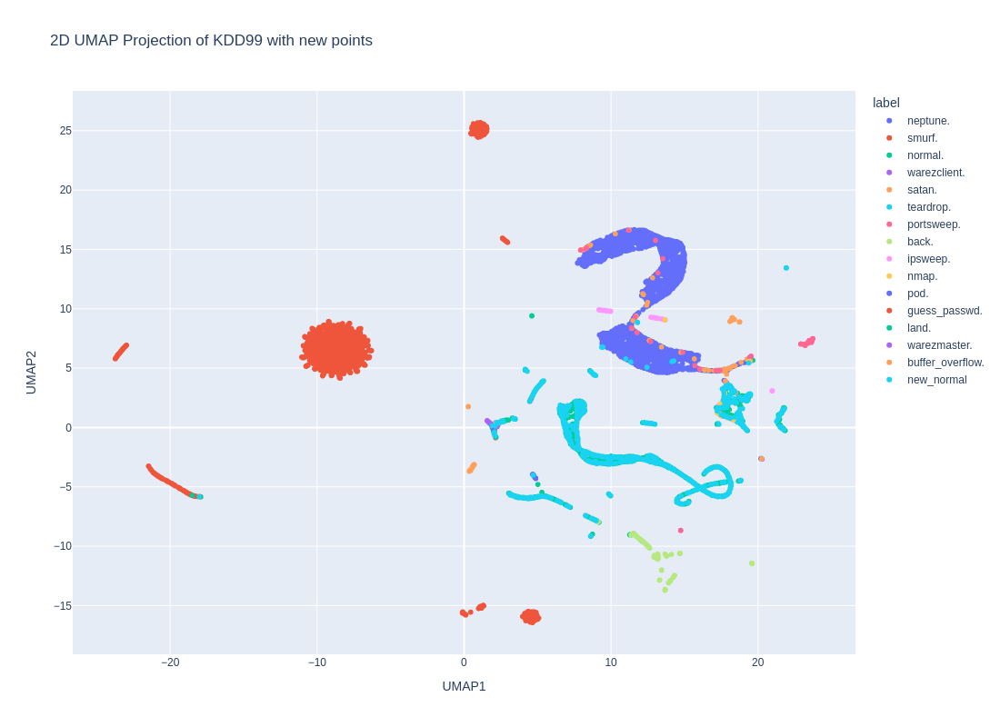

In [62]:
# Representar con Plotly
fig_2d = px.scatter(df_with_new_points, x='UMAP1', y='UMAP2', color='label', title="2D UMAP Projection of KDD99 with new points", height=800)  # Set the height in pixels (adjust as needed))
fig_2d.show()

Nos quedamos solo con los datos normales, y vemos como, al proyectar nuevos datos normales no vistos, se adaptan a las regiones originales. 

**Ejercicio**: proyectar solo datos normales y ver qué pasa. Hint: los datos normales salen bastante distintos, ya que no cuentan con la influencia de los ataques.

## Análisis 2: Analizamos los clusters que se forman en una proyección de datos normales con un profile report comparativo

A continuación se seleccionan dos clusters, uno de datos normales y otro de datos anómalos, a partir de un conjunto de datos previamente muestreado.








In [72]:
# Filtramos para quedarnos con los datos de 2 clusters
normal_cluster_index = 7
anomalous_cluster_index = 3

Se asignan los clusters a los datos originales:

In [78]:
# Obtenemos los datos originales 
original_df = kdd99.loc[X_sample.index]
original_df['cluster'] = df_2d['cluster'].to_list()

# Filtramos por índices
normal_df = original_df[original_df["cluster"] == normal_cluster_index]
anomalous_df = original_df[original_df["cluster"] == anomalous_cluster_index]

Se generan reportes para ambos grupos utilizando ydata_profiling. Finalmente, se crea un reporte comparativo entre los dos grupos (normal y anómalo) y se guarda en formato HTML. El objetivo es investigar en detalle las diferencias entre los dos clusters mediante la funcionalidad de comparación de los reportes.

In [86]:
profile_normal = ProfileReport(normal_df, title="Normal Data", minimal=True)
profile_anomalous = ProfileReport(anomalous_df, title="Anomalous Data", minimal=True)

# Generamos un Report comparativo
comparative_report = profile_normal.compare(profile_anomalous)

# Y lo guardamos como HTML
comparative_report.to_file(f"{REPORTING_PATH}comparative_report.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]